**Task 2:** Find a data set which is suitable for classification (you can use one of the data sets which you used in Homework II) with **numerical features** only (if the data set involves categorical ones in addition to numerical ones, you can drop the categorical ones). Build a [LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) classifier with `penalty=None` which requires scaling of numerical features with [StandardScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) and dimension reduction of numerical features with [PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html). Show us the workflow and report the accuracy of the resulting model on the unseen data.


#### Instructions to follow:

- Include all your codes here. Be sure that your code is CLEAN, READABLE, and REPRODUCIBLE.
- Put your data set into a **datasets** folder.
- Put your images (if available) into an **images** folder.
- Please return a NICE and CLEAR homework. Otherwise, it will not be graded.
- Please write YOUR OWN code. **DO NOT copy** my codes or someone else's codes.
- Please **DO NOT use** IRIS data set or Breast Cancer data set for this task.

Hint: In this example, you have to apply two pre-processing approaches to your training data sequentially. When you are doing this, please be sure that you are **avoiding data leakage**. I want to see whether you got the one of the main ideas of this course in this last homework.

### Additional Libraries: 

In [4]:
import pandas as pd
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import set_config


from sklearn.model_selection import train_test_split

set_config(transform_output="pandas") 

## Data Decription
### Body signal of smoking

I used the body signal of smoking data, which is the dual classification data that I used in the first part of the second assignment, in this part again: This dataset is a collection of basic health biological signal data. The goal is to determine the presence or absence of smoking through bio-signals.


This dataset is a collection of basic health biological signal data.
The goal is to determine the presence or absence of smoking through bio-signals.

Features of dataset: 
* ID : serial number given to a person. (I already drop this column.) 
* gender: the gender of a person being either female or male. 
* age : 5-years gap age groups. 
* height(cm) 
* weight(kg)
* waist(cm) : Waist circumference length 
* eyesight(left): Denoted by a value between 0.1-2.5, or 9.9 
* eyesight(right): Denoted by a value between 0.1-2.5, or 9.9 
* hearing(left): hearing of the person's ear (1 - normal, 2 - abnormal) 
* hearing(right): hearing of the person's ear (1 - normal, 2 - abnormal) 
* systolic : blood pressure. 
* relaxation : blood pressure. 
* fasting blood sugar: blood sugar before meals level 
* Cholesterol : total 
* triglyceride 
* HDL : cholesterol type 
* LDL : cholesterol type 
* hemoglobin 
* Urine protein 
* serum creatinine 
* AST : glutamic oxaloacetic transaminase type 
* ALT : glutamic oxaloacetic transaminase type 
* Gtp : γ-GTP 
* oral : Oral Examination status (s whether the examinee accepted the oral examination). 
* dental caries 
* tartar : tartar status 
* TARGET VARIABLE: smoking: smoking status of a person (1 - smoking, 0 - non-smoking) 


In [5]:
df=pd.read_csv("../datasets/smoking.csv")
df.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


I renamed the row names for ease of use:

In [6]:
df.rename(columns = {"height(cm)" : "height", "weight(kg)" : "weight",
                     "waist(cm)" : "waist", "eyesight(left)" : "eyesight_left",
                     "eyesight(right)" : "eyesight_right", "hearing(left)" : "hearing_left",
                     "hearing(right)" : "hearing_right", "fasting blood sugar" : "fasting_blood_sugar",
                     "Cholesterol" : "cholesterol", "HDL" : "hdl", "LDL" : "ldl",
                     "Urine protein" : "urine_protein", "serum creatinine" : "serum_creatinine",
                     "AST" : "ast", "ALT" : "alt", "Gtp" : "gtp", "dental caries" : "dental_caries"},
          inplace = True)

In [7]:
df.oral.nunique() 

1

We don't need to keep this value as there is only one oral value in the whole dataset. I dropped this feature: 

In [4]:
df.drop("oral",axis=1, inplace=True) 

## Pre-processing
- Split your data into train and test sets.
- Scale your numerical features with [StandardScaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html) here.
- Reduce the dimension of you scaled features with [PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) here by applying principal components to your scaled data set.
- While applying PCA, show us how you selected the best number of principal components for this data set.

In [9]:
X = df[df.columns[:-1]] #keep all features as X values except smoking value 
y = df[["smoking"]] #target variable

In [10]:
y.value_counts()

smoking
0          35237
1          20455
dtype: int64

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 1773, stratify=y)

In [12]:
print(y_train.value_counts())
print(y_test.value_counts())

smoking
0          28189
1          16364
dtype: int64
smoking
0          7048
1          4091
dtype: int64


I set the stratify parameter to stratify= y to keep the density of the classes equal in the classification datasets, and the result is:
* All data's density of y: 35237/20455 = 1.7226595
* Train data's density of y:28189/16364 = 1.72262283
* Test data's density of y:7048/4091 = 1.72280616

I combined two properties eyeseight left and right into one column: 

In [13]:
X_train["eyesight"] = (X_train["eyesight_left"] + X_train["eyesight_right"])/2.0
X_train.drop(['eyesight_left', 'eyesight_right'], axis = 1, inplace = True)

X_test["eyesight"] = (X_test["eyesight_left"] + X_test["eyesight_right"])/2.0
X_test.drop(['eyesight_left', 'eyesight_right'], axis = 1, inplace = True)

In [14]:
for column in X_train.columns:
    print("Feature: ", column, ", value Counts: ",len(X_train[column].value_counts()))

Feature:  ID , value Counts:  44553
Feature:  gender , value Counts:  2
Feature:  age , value Counts:  14
Feature:  height , value Counts:  12
Feature:  weight , value Counts:  22
Feature:  waist , value Counts:  548
Feature:  hearing_left , value Counts:  2
Feature:  hearing_right , value Counts:  2
Feature:  systolic , value Counts:  129
Feature:  relaxation , value Counts:  92
Feature:  fasting_blood_sugar , value Counts:  263
Feature:  cholesterol , value Counts:  280
Feature:  triglyceride , value Counts:  389
Feature:  hdl , value Counts:  123
Feature:  ldl , value Counts:  284
Feature:  hemoglobin , value Counts:  141
Feature:  urine_protein , value Counts:  6
Feature:  serum_creatinine , value Counts:  33
Feature:  ast , value Counts:  209
Feature:  alt , value Counts:  238
Feature:  gtp , value Counts:  458
Feature:  oral , value Counts:  1
Feature:  dental_caries , value Counts:  2
Feature:  tartar , value Counts:  2
Feature:  eyesight , value Counts:  56


As you can see above, most features of our data, which contains approximately 56 thousand data, seem to be categorical. Let's take a look at these:

Even though the continuous values for 55 thousand data are not very continuous and are distributed in a certain interval, I took the numerically increasing or decreasing values such as length, age, weight, eye number as continuous. I accepted the other values as categorical and acted accordingly for this works i dropped these features. 

In [17]:
numeric_features="age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine"
a=numeric_features.split(",")
X_train=X_train[a]
X_test=X_test[a]


In [18]:
X_train.head()

,age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine
49685,60,165,100,109.0,136.0,86.0,100.0,218.0,124.0,42.0,151.0,30.0,40.0,58.0,16.3,0.75,1.3
46389,35,170,65,84.0,130.0,68.0,92.0,252.0,233.0,45.0,160.0,20.0,20.0,39.0,15.2,1.00,0.7
4318,55,165,65,87.0,116.0,79.0,115.0,192.0,73.0,48.0,129.0,31.0,21.0,16.0,15.6,0.80,0.9
42665,40,165,65,83.5,120.0,90.0,101.0,244.0,188.0,84.0,122.0,24.0,36.0,64.0,16.2,1.35,1.1
36473,40,165,65,76.0,110.0,70.0,114.0,201.0,86.0,73.0,111.0,33.0,28.0,73.0,15.6,1.20,1.0


In [19]:
X_train.corr()

,age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine
age,1.000000,-0.477899,-0.324233,-0.026011,0.139407,0.053882,0.184765,0.056146,0.013453,0.009051,0.043164,0.032411,-0.060858,0.011128,-0.262856,-0.237909,-0.116253
height,-0.477899,1.000000,0.675810,0.379042,0.074652,0.109317,0.017181,-0.084022,0.154175,-0.215057,-0.049154,0.038251,0.119292,0.138533,0.540137,0.187010,0.415345
weight,-0.324233,0.675810,1.000000,0.822487,0.261419,0.266343,0.134791,0.025151,0.324329,-0.360839,0.038836,0.119088,0.239097,0.212541,0.493164,0.134821,0.348213
waist,-0.026011,0.379042,0.822487,1.000000,0.315566,0.288942,0.210241,0.064845,0.362397,-0.378169,0.071615,0.140706,0.240344,0.244348,0.387047,0.037958,0.250915
systolic,0.139407,0.074652,0.261419,0.315566,1.000000,0.758486,0.174478,0.057840,0.197355,-0.088541,0.015835,0.078884,0.087329,0.164697,0.182791,-0.021010,0.073102
relaxation,0.053882,0.109317,0.266343,0.288942,0.758486,1.000000,0.148895,0.092826,0.214274,-0.089285,0.039301,0.083355,0.099203,0.176461,0.230544,0.010902,0.087620
fasting_blood_sugar,0.184765,0.017181,0.134791,0.210241,0.174478,0.148895,1.000000,0.009725,0.225751,-0.121983,-0.019998,0.062291,0.079902,0.177718,0.097754,-0.048856,0.042333
cholesterol,0.056146,-0.084022,0.025151,0.064845,0.057840,0.092826,0.009725,1.000000,0.249138,0.169316,0.734989,0.027046,0.048071,0.085078,0.060367,-0.011309,0.007830
triglyceride,0.013453,0.154175,0.324329,0.362397,0.197355,0.214274,0.225751,0.249138,1.000000,-0.412582,0.027298,0.097713,0.166342,0.301926,0.271223,0.023636,0.135264
hdl,0.009051,-0.215057,-0.360839,-0.378169,-0.088541,-0.089285,-0.121983,0.169316,-0.412582,1.000000,-0.052933,-0.037581,-0.124455,-0.055969,-0.242942,-0.024414,-0.188561


In [20]:
X_train.corr()>0.80 

,age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine
age,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
height,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
weight,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waist,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False
systolic,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
relaxation,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
fasting_blood_sugar,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False
cholesterol,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
triglyceride,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
hdl,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False


It is observed that there is an intense correlation in weight-waist features in the dataset. However, since we will do PCA, I will continue without touching this data.

In [21]:
X_train.describe() #before scaling

,age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine
count,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000,44553.000000
mean,44.191412,164.644693,65.893543,82.083678,121.513501,76.011514,99.267389,196.922789,126.420084,57.277804,115.079568,26.185397,27.063789,39.847620,14.625094,1.010277,0.885337
std,12.066924,9.181799,12.820919,9.262963,13.648069,9.633969,20.595003,36.331410,71.492091,14.701770,41.197285,19.691171,32.391788,49.788863,1.561859,0.398501,0.206466
min,20.000000,135.000000,30.000000,51.000000,71.000000,40.000000,46.000000,55.000000,8.000000,4.000000,1.000000,6.000000,1.000000,1.000000,4.900000,0.100000,0.100000
25%,40.000000,160.000000,55.000000,76.000000,112.000000,70.000000,89.000000,172.000000,74.000000,47.000000,92.000000,19.000000,15.000000,17.000000,13.600000,0.800000,0.800000
50%,40.000000,165.000000,65.000000,82.000000,120.000000,76.000000,96.000000,195.000000,107.000000,55.000000,113.000000,23.000000,21.000000,25.000000,14.800000,1.000000,0.900000
75%,55.000000,170.000000,75.000000,88.000000,130.000000,82.000000,104.000000,220.000000,160.000000,66.000000,136.000000,28.000000,31.000000,43.000000,15.800000,1.200000,1.000000
max,85.000000,190.000000,135.000000,129.000000,240.000000,146.000000,505.000000,445.000000,548.000000,618.000000,1860.000000,1311.000000,2914.000000,999.000000,21.100000,9.900000,10.000000


Before doing PCA, we need to scale the data. When you don't do this, your PCA values seem too large. For this, I imported the Standard Scalar and PCA processes from the sklearn library and added both processes to the pipeline.

Unfortunately, we won't be able to see the difference of describe because I use standardscalar and pca as a pipeline 

In [24]:
pipeline=make_pipeline(StandardScaler(), PCA()) 

Since I will try the PCA-free version of the data in the model later, I will continue with the copy for now.

In [33]:
X_train_pca=X_train.copy() 
X_test_pca=X_test.copy() 

In [34]:
X_train_pca = pipeline.fit_transform(X_train_pca)
#rename columns 
X_train_pca.columns = ["PC1", "PC2", "PC3", "PC4","PC5", "PC6", "PC7", "PC8","PC9", "PC10", "PC11","PC12","PC13", "PC14", "PC15", "PC16","PC17"]
X_train_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
49685,3.864591,0.979798,-1.001570,-0.744587,-0.622983,1.884896,0.810244,0.177516,1.215929,-1.731058,0.004927,-0.087229,0.825250,-0.052970,-0.173062,-0.178762,0.499700
46389,0.756193,0.350497,-1.708077,0.795988,-0.720803,-0.921274,0.639077,-0.371785,-1.144324,0.622774,0.034286,-0.237145,-0.471220,-0.006324,1.144085,-0.177312,-0.434107
4318,0.197282,0.332037,-0.055675,-0.407081,-0.695501,0.856147,0.036081,0.030535,1.006780,0.285039,-0.648792,-0.664457,-0.034992,-0.328591,-0.582174,-0.130798,-0.245844
42665,1.088717,0.560565,-1.006008,0.635561,1.513393,-0.317757,-1.565990,0.458054,-0.349371,-0.212131,1.231582,-0.357847,0.575322,0.178246,-0.983244,0.196155,-0.174826
36473,-0.276735,-0.544672,0.342013,1.097054,0.287385,0.038361,-1.717908,-0.063379,0.375942,-0.000405,-0.126743,-0.194339,0.272248,-0.168645,-0.088384,-0.019894,0.326533


In [35]:
pca = pipeline.named_steps['pca'] #i pulled pca process from pipeline to get load vectors in rotation matrix

In [123]:
#this rotation matrix which I use visualize train and test datas. Actually this matrix fit PCA process. 

#I rename this dataset columns to be meaningful.
rotm = pd.DataFrame(pca.components_.T, 
                       index=X_train_deneme.columns, 
                       columns=['Load_vec1', 'Load_vec2',  'Load_vec3', 'Load_vec4',
                                'Load_vec5', 'Load_vec6',  'Load_vec7', 'Load_vec8',
                                'Load_vec9', 'Load_vec10',  'Load_vec11', 'Load_vec12',
                                'Load_vec13', 'Load_vec14',  'Load_vec15', 'Load_vec16','Load_vec17' ])                                                                             
rotm

,Load_vec1,Load_vec2,Load_vec3,Load_vec4,Load_vec5,Load_vec6,Load_vec7,Load_vec8,Load_vec9,Load_vec10,Load_vec11,Load_vec12,Load_vec13,Load_vec14,Load_vec15,Load_vec16,Load_vec17
age,-0.123830,0.426507,0.070115,-0.211910,-0.256907,0.159239,-0.037180,0.268266,0.258483,-0.423434,0.017990,-0.362897,-0.415516,0.116411,-0.100269,0.003251,0.117608
height,0.327038,-0.371268,-0.065093,0.050386,0.096395,0.109554,-0.104023,-0.132981,-0.017992,0.071330,-0.045118,0.036261,-0.772569,0.095881,-0.036409,-0.005239,-0.287160
weight,0.423004,-0.162167,-0.076162,-0.031225,-0.032011,0.045819,0.160853,-0.327940,0.137861,-0.208661,0.096117,0.053149,-0.011181,-0.033645,-0.025738,-0.035162,0.757422
waist,0.384927,0.030237,-0.047674,-0.103061,-0.158140,0.050151,0.219684,-0.316540,0.218683,-0.408428,0.112117,-0.082585,0.307691,-0.076419,-0.027625,0.055024,-0.568955
systolic,0.220598,0.301468,-0.037421,-0.397238,0.406911,0.014573,0.102867,0.079036,-0.004884,0.059064,-0.019769,0.081408,-0.061106,0.045974,0.707818,-0.033119,-0.012490
relaxation,0.232813,0.276237,-0.063663,-0.353511,0.447572,-0.019805,0.086818,0.103222,-0.075401,0.153966,-0.041155,0.090724,0.028035,-0.031445,-0.692569,0.025081,-0.013841
fasting_blood_sugar,0.129616,0.214389,0.082973,-0.197445,-0.283642,-0.140072,-0.557712,-0.274218,0.457321,0.421432,-0.044109,0.118991,0.033402,-0.024248,-0.004041,-0.021965,-0.001715
cholesterol,0.049447,0.331734,-0.511907,0.353028,0.033477,-0.040081,-0.081291,-0.062388,-0.059406,0.003133,0.212939,-0.016756,-0.042364,-0.005244,-0.013033,-0.659073,-0.045487
triglyceride,0.267816,0.171282,-0.064875,-0.041711,-0.355958,-0.348230,-0.036820,0.129569,-0.476163,0.100807,0.509926,-0.008275,-0.099719,-0.030610,0.032598,0.343173,0.013318
hdl,-0.235085,0.052534,-0.017546,0.139934,0.494809,0.121845,-0.427888,-0.320440,0.030214,-0.215325,0.440055,-0.142746,0.018551,0.026441,0.002391,0.337535,0.018768


In [125]:
numbr_of_columns=range(len(X_train_pca.columns)) 

range(0, 17)

We drew a heatmap showing how much each pca is affected by which feature. For this reason, I had the numerical values of each value drawn in a written heatmap graph.

While doing this, the "pca.n_components" parameter gives us the rotation matrix. While researching in different sources, he states that squaring these values will explain which feature shows which weight for that PCA. However, since I did not see this in Sklearn's documentation about PCA and in the course, I will proceed without considering this, as medium towards data science resources generally make mistakes in such cases. (I noticed that such sources have data leakage in many places, especially while examining for the project.)

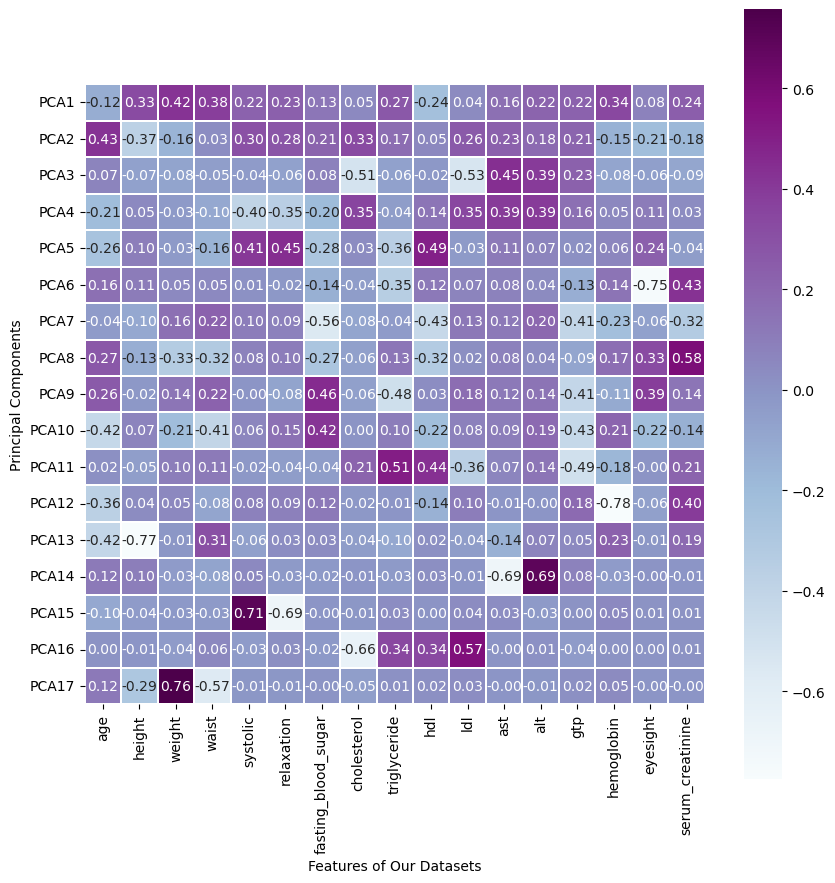

In [141]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10,10]


# Feature Weight
sns.heatmap(pca.components_, cmap='BuPu',
                 yticklabels=["PCA"+str(x) for x in range(1,pca.n_components_+1)],
                 xticklabels=list(X_train.columns),
                 annot=True,
                 fmt='.2f',
                 square=True,
                 linewidths=0.05,
                 cbar_kws={"orientation": "vertical"})

plt.xlabel("Features of Our Datasets")
plt.ylabel("Principal Components")

plt.show()

When I look at the first 3 values of PCA values that we will examine, I see that the first one is fed by weight, height, waist and hemoglobin values.
we see that the second one is nourished by age, height, chlosterol, and the third is more prominently nourished by cholesterol, ldl, subordinate and subordinate features. Unfortunately, I couldn't make a comment about these. Maybe we can associate the dominant height of height with gender.
On the other hand, we can see that PCA 15(systolic-relaxation) specifically indicates blood pressure and PCA 14  (alt-ast) specifically indicates the glutamic oxaloacetic transaminase type.

The explained_variance_ parameter return the variance of each PCA. This also returns the eigenvalue:

In [40]:
pca.explained_variance_ #return PCA's variance 

array([3.99877458, 2.097073  , 1.71356537, 1.65978399, 1.27290911,
       0.95832755, 0.91251392, 0.81366201, 0.79533438, 0.66811882,
       0.5421938 , 0.49863739, 0.34964757, 0.25055788, 0.23342685,
       0.14505619, 0.09079918])

In [41]:
#returns the proportion of each variance so that their sum is 1
pca.explained_variance_ratio_

array([0.23521675, 0.12335447, 0.1007957 , 0.09763216, 0.07487533,
       0.05637094, 0.05367608, 0.0478614 , 0.04678332, 0.03930022,
       0.03189304, 0.02933095, 0.02056704, 0.01473837, 0.01373068,
       0.00853253, 0.00534101])

The two graphs we drew in the lesson (Proportion of Variance Explained and Cumulative Explained of Variance Explained) are important for us to see how many values will be sufficient in the model. Considering those graphs, I created a composite graph myself. From this graph:

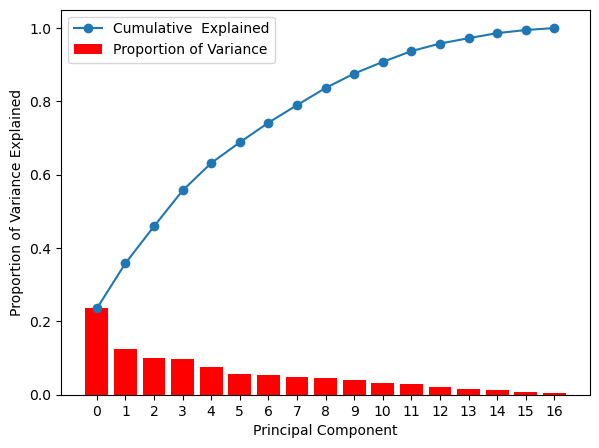

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
plt.rcParams['figure.figsize'] = [15, 5]

# Left-hand: Scree plot
plt.subplot(1, 2, 1)
plt.bar(numbr_of_columns, pca.explained_variance_ratio_, color="red",label='Proportion of Variance')
plt.plot(numbr_of_columns, np.cumsum(pca.explained_variance_ratio_), '-o', label='Cumulative  Explained')
plt.xlabel('Principal C')

plt.ylabel('Proportion of Variance Explained')
plt.xlabel('Principal Component')
plt.ylim(0,1.05)
plt.xticks(numbr_of_columns)
plt.legend(loc=2)

plt.show();

##soldaki script plot

We can see which PCA values represent the features and how much. Actually, the results are not very good, I think we represent 0.9 data in 14 PCA. As far as I understand, the purpose of PCA is to fit a dataset with less but more dense features. Here the variance rates seem to be very low. This means that in our binary visualization it will explain the variance of very little of the data ~0.3. In this case, it cannot be said that the data is spread correctly.

## Visualization

- Take the first two principal components you found, namely principal component 1 and 2,  and visualize these two principal components in the train and test data with respect to class labels of the sample points, separetely. 
- If possible, comment on the visualization to tell us how class labels are changing respect to principal component 1 and 2.
- Based on these plots, can you make a guess whether logistic regression will result in a higher accuracy in train and test data? (If you found out that the appropriate number of principal components is larger than 2, of course, the visualization you have just done cannot reveal the real story). But, in any way, tell us whether you expect a higher accuracy or not before implementing your classifier below.

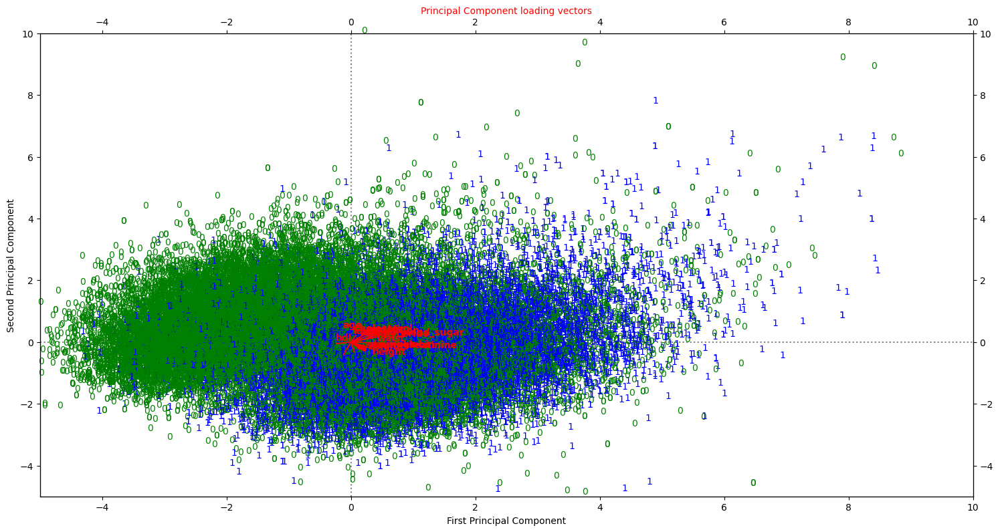

In [59]:
#change the direction of PC2 to increase variability
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = [18, 9]

fig , ax1 = plt.subplots()

# Plot Principal Components 1 and 2
for i in X_train_pca.index:    
    if y_train.loc[i].smoking==1 :
        ax1.annotate(str(y_train.loc[i].smoking), (X_train_pca.PC1.loc[i], X_train_pca.PC2.loc[i]), ha='center',color="blue")
    elif y_train.loc[i].smoking==0:
        ax1.annotate(str(y_train.loc[i].smoking), (X_train_pca.PC1.loc[i], X_train_pca.PC2.loc[i]), ha='center',color="green")
# Plot reference lines
ax1.hlines(0,-5,15, linestyles='dotted', colors='grey')
ax1.vlines(0,-5,15, linestyles='dotted', colors='grey')

ax1.set_xlim(-5,10)
ax1.set_ylim(-5,10)

ax1.set_xlabel('First Principal Component')
ax1.set_ylabel('Second Principal Component')
    

# Plot Principal Component loading vectors, using a second y-axis.
ax2 = ax1.twinx().twiny() 

ax2.set_ylim(-5,10)
ax2.set_xlim(-5,10)
ax2.tick_params(axis='y', colors='red')
ax2.set_xlabel('Principal Component loading vectors', color='red')

# Plot labels for vectors. Variable 'a' is a small offset parameter to separate arrow tip and text.
a = 1.07  
for i in rotm[['Load_vec1', 'Load_vec2']].index:
    
    ax2.annotate(i, (rotm.Load_vec1[i]*a, rotm.Load_vec2[i]*a), color='red', fontweight='bold')

plt.show();

In [65]:
X_test_pca = pipeline.transform(X_test_pca)
X_test_pca.columns = ["PC1", "PC2", "PC3", "PC4",
                  "PC5", "PC6", "PC7", "PC8",
                  "PC9", "PC10", "PC11","PC12","PC13", "PC14", "PC15", "PC16","PC17"]


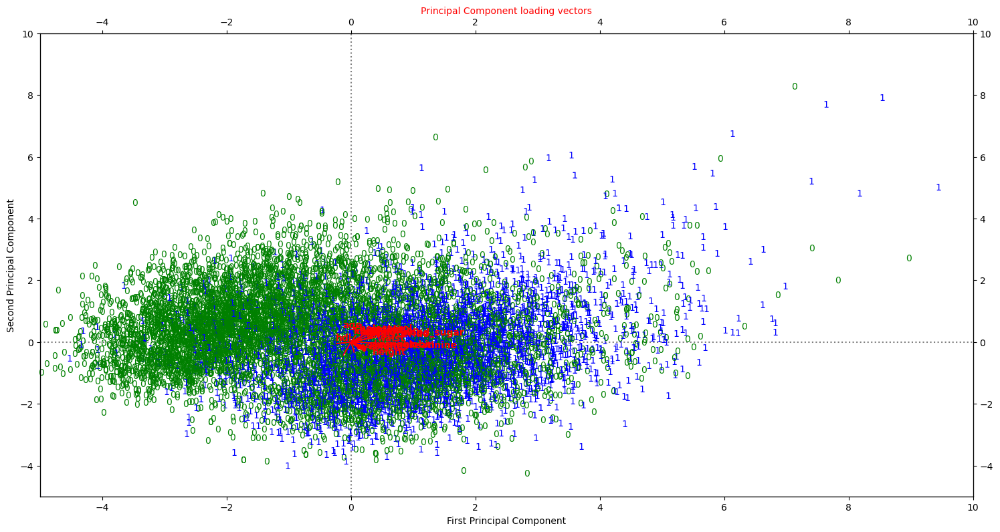

In [67]:
#change the direction of PC2 to increase variability
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = [18, 9]

fig , ax1 = plt.subplots()

# Plot Principal Components 1 and 2
for i in X_test_pca.index:    
    if y_test.loc[i].smoking==1 :
        ax1.annotate(str(y_test.loc[i].smoking), (X_test_pca.PC1.loc[i], X_test_pca.PC2.loc[i]), ha='center',color="blue")
    elif y_test.loc[i].smoking==0:
        ax1.annotate(str(y_test.loc[i].smoking), (X_test_pca.PC1.loc[i], X_test_pca.PC2.loc[i]), ha='center',color="green")
# Plot reference lines
ax1.hlines(0,-5,15, linestyles='dotted', colors='grey')
ax1.vlines(0,-5,15, linestyles='dotted', colors='grey')

ax1.set_xlim(-5,10)
ax1.set_ylim(-5,10)

ax1.set_xlabel('First Principal Component')
ax1.set_ylabel('Second Principal Component')
    

# Plot Principal Component loading vectors, using a second y-axis.
ax2 = ax1.twinx().twiny() 

ax2.set_ylim(-5,10)
ax2.set_xlim(-5,10)
ax2.tick_params(axis='y', colors='red')
ax2.set_xlabel('Principal Component loading vectors', color='red')

# Plot labels for vectors. Variable 'a' is a small offset parameter to separate arrow tip and text.
a = 1.07  
for i in rotm[['Load_vec1', 'Load_vec2']].index:
    
    ax2.annotate(i, (rotm.Load_vec1[i]*a, rotm.Load_vec2[i]*a), color='red', fontweight='bold')

    

plt.show();

Text(0.5, 1.0, "Two of PCA's Test Visualization")

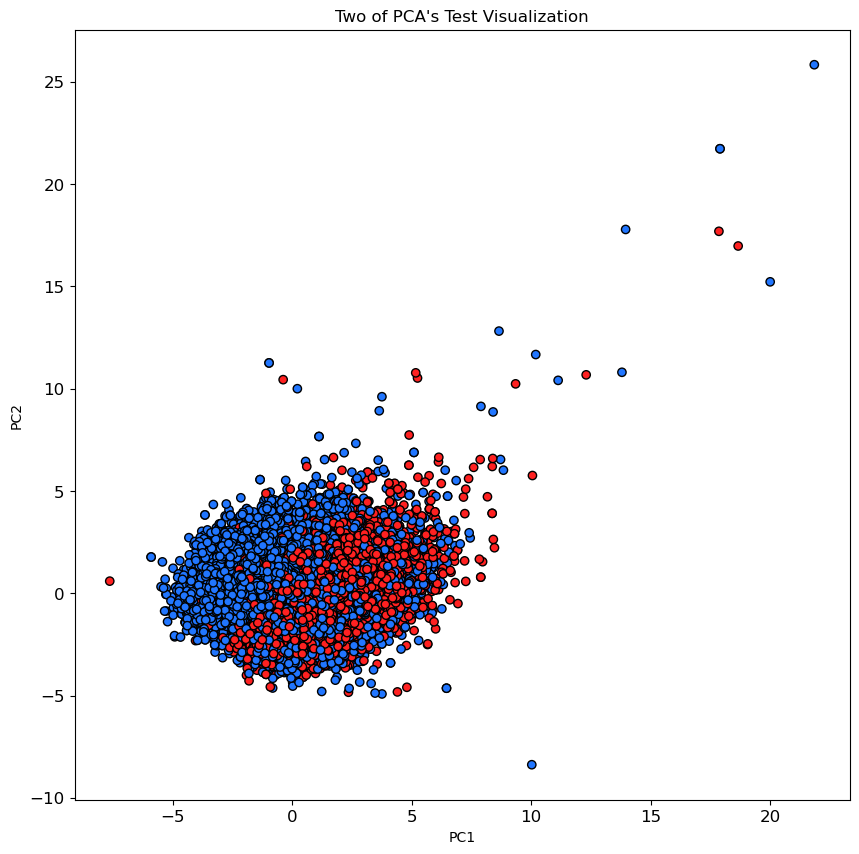

In [139]:
colour = ['#ff2121' if y == 1 else '#2176ff' for y in y_train.smoking]
plt.scatter(X_train_pca.PC1,X_train_pca.PC2 ,c=colour,edgecolors='#000000')
plt.yticks(size=12)
plt.xticks(size=12)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title("Two of PCA's Train Dataset Visualization")

Text(0, 0.5, 'PC2')

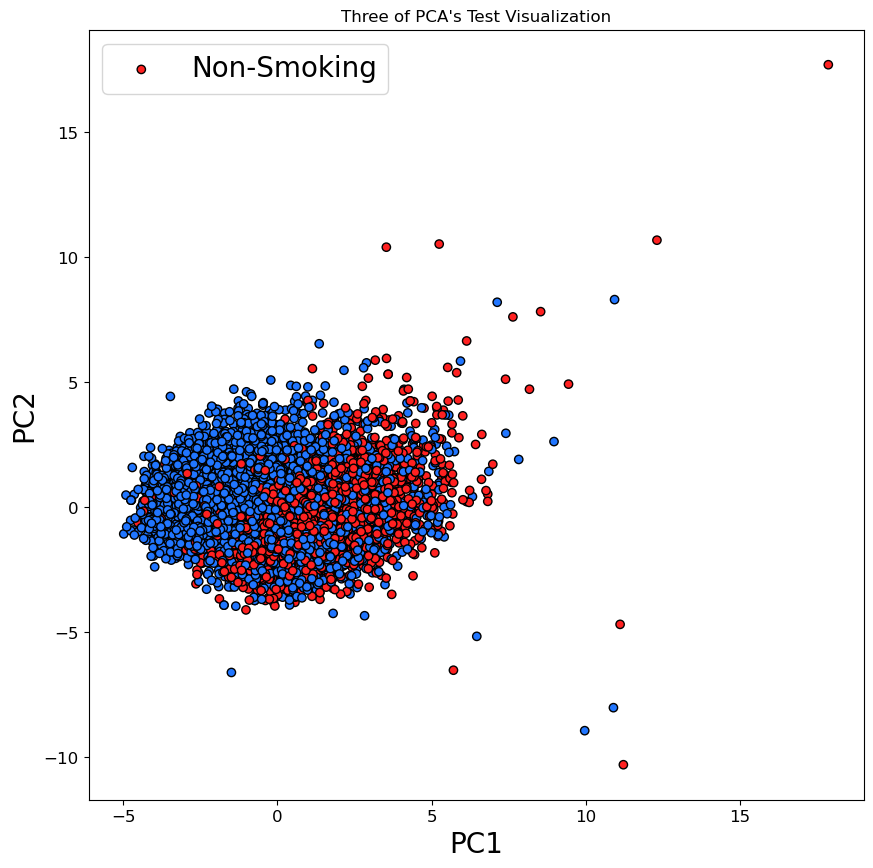

In [140]:
colour = ['#ff2121' if y == 1 else '#2176ff' for y in y_test.smoking]
plt.scatter(X_test_pca.PC1,X_test_pca.PC2 ,c=colour,edgecolors='#000000')
plt.ylabel("Glucose",size=20)
plt.xlabel('Age',size=20)
plt.yticks(size=12)
plt.xticks(size=12)
plt.legend(['Non-Smoking','Smoking'],loc =2,prop={"size":20})
plt.title("Three of PCA's Test Dataset Visualization")
plt.xlabel('PC1')
plt.ylabel('PC2')

### Visualization Comments Two Components 
In the variation distribution graph we drew above, we were able to interpret that the appropriate PCA number was much more than 2. While visualizing with 2 PCA, I had two different graphics drawn, in one of them, I also drew the vector locations of the features. It is difficult to make a clear interpretation of the data because it is so intertwined, but non-smokers have negative PCA1 values, while PCA2 values seem to be positive and higher. Since the multiplicative inverse of the rotation matrices (-1*) is possible, we can observe that the PCA values are lower in the values of LoadVec1 that we get in this way. If PCA1 is negative and height and weight are low, which suggests that it might actually be a woman, we can make such a comment since we observed that men drank more in the previous assignment. However, it is very difficult to make any comments since PCA1 and PCA2 reveal only a small part of the data as variation. In the image, it is very difficult to separate the smokers and non-smokers from each other, there is a situation that is intertwined. It is not possible to comment on the vectorial places of the features, in fact, we can say that all values are predominantly on the smoking side. Finally, although we cannot comment much, it is observed that the train and the test appear on approximately similar graphics.

I also visualized with 3 PCA. Here, too, it is seen that the results are intertwined and no comment can be made.

In [135]:
import plotly.express as px
# Visualize our data
colors = px.colors.sequential.Plasma
colors[0], colors[1], colors[2] = ['red', 'green', 'blue']
fig = px.scatter_3d(X_train_pca, x='PC1', y='PC2', z='PC3', color=y_train.smoking.astype(str), color_discrete_sequence=colors, height=500, width=1000)
fig.update_layout(showlegend=False,
                  scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                    center=dict(x=0, y=0, z=-0.1),
                                    eye=dict(x=1.5, y=-1.4, z=0.5)),
                  margin=dict(l=0, r=0, b=0, t=0),
                  scene=dict(xaxis=dict(backgroundcolor='white',
                                        color='black',
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10)),
                             yaxis=dict(backgroundcolor='white',
                                        color='black',
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10)),
                             zaxis=dict(backgroundcolor='lightgrey',
                                        color='black', 
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10))))
fig.update_traces(marker=dict(size=3, line=dict(color='black', width=0.1)))
fig.show()

In [142]:
import plotly.express as px
# Visualize our data
colors = px.colors.sequential.Plasma
colors[0], colors[1], colors[2] = ['red', 'green', 'blue']
fig = px.scatter_3d(X_test_pca, x='PC1', y='PC2', z='PC3', color=y_test.smoking.astype(str), color_discrete_sequence=colors, height=500, width=1000)
fig.update_layout(showlegend=False,
                  scene_camera=dict(up=dict(x=0, y=0, z=1), 
                                    center=dict(x=0, y=0, z=-0.1),
                                    eye=dict(x=1.5, y=-1.4, z=0.5)),
                  margin=dict(l=0, r=0, b=0, t=0),
                  scene=dict(xaxis=dict(backgroundcolor='white',
                                        color='black',
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10)),
                             yaxis=dict(backgroundcolor='white',
                                        color='black',
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10)),
                             zaxis=dict(backgroundcolor='lightgrey', #ground
                                        color='black', 
                                        gridcolor='#f0f0f0',
                                        title_font=dict(size=10),
                                        tickfont=dict(size=10))))
fig.update_traces(marker=dict(size=3, line=dict(color='black', width=0.1)))

fig.show()

## Classifier Implementation

- Implement your classifier to your pre-processed (scaled + dimension reduced) data here. 

In [151]:
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression


pipeline = Pipeline([('scaler',StandardScaler()),
    ('pca', PCA()), 
    ('classifier', LogisticRegression(penalty=None))
])

# Define the parameter grid for grid search
param_grid = {
    'pca__n_components': range(2,len(X_train.columns)) 
}

# Perform grid search
#Using KFolds,folds are made keeping the sample percentage for each class.
kcv_index = StratifiedKFold(n_splits=5, shuffle=True, random_state=1773) 
grid_search = GridSearchCV(pipeline, param_grid, cv=kcv_index )
grid_search.fit(X_train, y_train.smoking)


best_model = grid_search.best_estimator_
test_pca_score = best_model.score(X_test, y_test.smoking)

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)
print("Test Score:", test_pca_score)

Best Parameters: {'pca__n_components': 13}
Best Score: 0.7174601688401112
Test Score: 0.7169404793967142


In [148]:
X_train.head() #check out X_train is correct dataset

,age,height,weight,waist,systolic,relaxation,fasting_blood_sugar,cholesterol,triglyceride,hdl,ldl,ast,alt,gtp,hemoglobin,eyesight,serum_creatinine
49685,60,165,100,109.0,136.0,86.0,100.0,218.0,124.0,42.0,151.0,30.0,40.0,58.0,16.3,0.75,1.3
46389,35,170,65,84.0,130.0,68.0,92.0,252.0,233.0,45.0,160.0,20.0,20.0,39.0,15.2,1.00,0.7
4318,55,165,65,87.0,116.0,79.0,115.0,192.0,73.0,48.0,129.0,31.0,21.0,16.0,15.6,0.80,0.9
42665,40,165,65,83.5,120.0,90.0,101.0,244.0,188.0,84.0,122.0,24.0,36.0,64.0,16.2,1.35,1.1
36473,40,165,65,76.0,110.0,70.0,114.0,201.0,86.0,73.0,111.0,33.0,28.0,73.0,15.6,1.20,1.0


In [154]:
#Create pipeline without PCA, only Scaler and classifier
pipeline = Pipeline([('scaler',StandardScaler()),
    ('classifier', LogisticRegression(penalty=None))
])

pipeline.fit(X_train, y_train.smoking)

#train_score = pipeline.score(X_train, y_train.smoking)
test_score = pipeline.score(X_test, y_test.smoking)

#cv score value of X_train dataset for correct comparison
kcv_index = StratifiedKFold(n_splits=5, shuffle=True, random_state=1773) 
cv_scores = cross_val_score(pipeline, X_train, y_train.smoking, cv=kcv_index)
# Print tran and test score without PCA
print("Train Score all features without PCA:", cv_scores.mean())
print("Test Score  all features without PCA::", test_score)

Train Score all features without PCA: 0.7190089400092019
Test Score  all features without PCA:: 0.7181973247149654


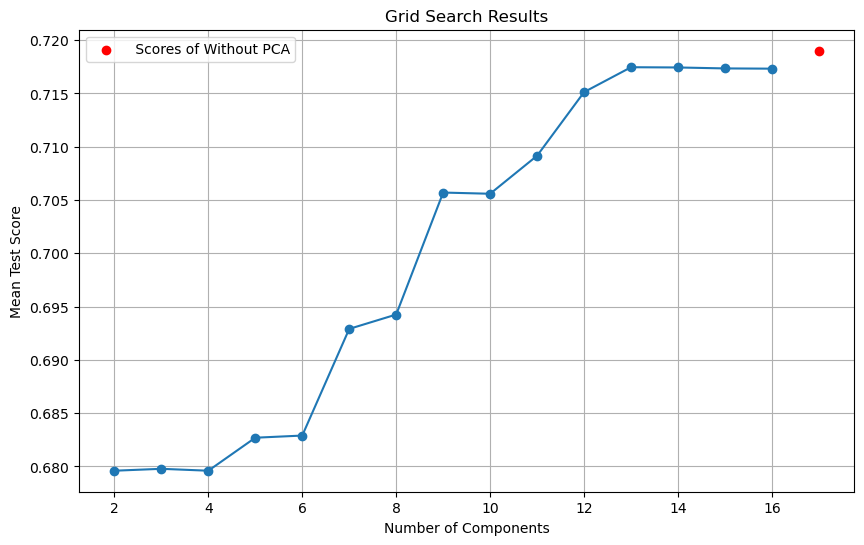

In [155]:
results = grid_search.cv_results_

# Get the parameter values and scores
param_values = results['param_pca__n_components'].data
mean_scores = results['mean_test_score']

# Plot the scores
plt.figure(figsize=(10, 6))
plt.plot(param_values, mean_scores, marker='o')
plt.scatter(17,cv_scores.mean(), color='red', label=' Scores of Without PCA')

plt.xlabel('Number of Components')
plt.ylabel('Mean Test Score')
plt.title('Grid Search Results')
plt.grid(True)
plt.legend(loc =2)
plt.show()



## Conclusion

- Report the accuracy of the built classifier on the train and test data, respectively. Comment on whether model needs any improvement due to under-fitting or over-fitting. If so, provide a suggestion.

Finally, I researched how many PCAs to use while creating my classification model with GridSearchCV and observed that the model using 13 PCAs gave the best results. We can obtain the optimum value for the accuracy we obtained with X_train with the PCA value of 13. Frankly, we could not enter a large numerical feature reduction, the fact that the PCA variance rates were very low, actually caused us to predict this problem in the first graph we drew.

I think maybe we could get higher accuracy with less PCA if we first removed the correlated features and then applied PCA.

The results are like this

**Best Parameters: {'pca__n_components': 13} \
Best Score: 0.7174601688401112 \
Test Score: 0.7169404793967142**

**Train Score all features without PCA: 0.7199066280609611 \
Test Score  all features without PCA:: 0.7181973247149654**